# Evolutionary Computation in Routing (Using Genetic Algorithm)

## Import
Importing the required packages

In [1]:
from abc import ABC, abstractmethod
from typing import Callable
import math

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import matplotlib.artist as artist
# import matplotlib.collections as collections
import IPython.display
plt.rcParams["animation.html"] = "jshtml"

## Definition Common Methods

### Distance Calculator

In [2]:
class Distance:
  @classmethod
  def simple(self, start: tuple[float, float], end: tuple[float, float]) -> float:
    return (end[0] - start[0]) + (end[1] - start[1])
  @classmethod
  def euclidean_squared(self, start: tuple[float, float], end: tuple[float, float]) -> float:
    """
    Calculates the squared Euclidean distance between two points in 2D space.

    Parameters:
      start (tuple[float, float]): The starting point.
      end (tuple[float, float]): The ending point.

    Returns:
      float: The squared Euclidean distance between the two points.
    """
    return ((end[0] - start[0]) ** 2) + ((end[1] - start[1]) ** 2)
  @classmethod
  def euclidean(self, start: tuple[float, float], end: tuple[float, float]) -> float:
    """
    Calculates the Euclidean distance between two points in 2D space.

    Parameters:
      start (tuple[float, float]): The starting point.
      end (tuple[float, float]): The ending point.

    Returns:
      float: The Euclidean distance between the two points.
    """
    # return math.sqrt(euclidean_squared(start, end))
    # return numpy.hypot(end[0] - start[0], end[1] - start[1])
    return np.linalg.norm(np.array(start) - np.array(end))

### Score Calculator

In [3]:
class Score:
  @classmethod
  def euclidean_sum(self, path: list[tuple[float, float]]) -> float:
    return sum(Distance.euclidean(path[i], path[i+1]) for i in range(len(path)-1))
  @classmethod
  def euclidean_squaredSum(self, path: list[tuple[float, float]]) -> float:
    return sum(Distance.euclidean_squared(path[i], path[i+1]) for i in range(len(path)-1))

## Definition Scene Tools

### Scene Generator

In [4]:
class SceneGenerator:
  @classmethod
  def grid(self, capacity: int, width: float, height: float, with_info: bool = False) -> tuple[float, float, int, list[list[tuple[float, float]]]] | list[tuple[float, float]]:
    nodes: list[tuple[float, float]] = [(np.random.uniform(0, width), np.random.uniform(0, height)) for _ in range(capacity)]
    if with_info:
      return width, height, capacity, nodes
    else:
      return nodes

  @classmethod
  def grid_expand(self, capacity: int, width: float, height: float, expand: tuple[int, int] = (1, 1), with_info: bool = False) -> tuple[float, float, int, list[list[tuple[float, float]]]] | list[tuple[float, float]]:
    nodes: list[tuple[float, float]] = [(width * expand_width + np.random.uniform(0, width), height * expand_height + np.random.uniform(0, width)) for _ in range(capacity) for expand_width in range(expand[0]) for expand_height in range(expand[1])]
    if with_info:
      width: float = width * expand[0]
      height: float = height * expand[1]
      capacity: int = capacity * expand[0] * expand[1]
      return width, height, capacity, nodes
    else:
      return nodes


### Scene Calculator

In [5]:
class SceneCalculator:
  @classmethod
  def occupied_area(self, width: float, height: float, number: int) -> float:
    return width * height / number

  @classmethod
  def transmission_range(self, width: float, height: float, number: int, transmittable_number: int) -> float:
    return math.sqrt(width * height * transmittable_number / (math.pi * number))
  
  @classmethod
  def transmission_area(self, transmission_range: float) -> float:
    return math.pi * transmission_range ** 2

  @classmethod
  def transmittable_number(self, width: float, height: float, number: int, transmission_range: float) -> float:
    return math.pi * transmission_range ** 2 * number / width * height

## Algorithm

### Abstract Algorithm

In [6]:
class DataDissemination(ABC):
  def __init__(self, transmissionRange: float, distance: Callable[[tuple[float, float], tuple[float, float]], float] = Distance.euclidean) -> None:
    """
    Parameters:
      transmissionRange (float): The transmission range of each node.
      distance (Callable[[tuple[float, float], tuple[float, float]], float]): A function that takes two nodes and returns the distance between them.
    """
    self.transmissionRange: float = transmissionRange
    self.distance: Callable[[tuple[float, float], tuple[float, float]], float] = distance

  @abstractmethod
  def route(self, nodes: list[tuple[float, float]], start: tuple[float, float], end: tuple[float, float], getHistory: bool = False, verbose: bool = False) -> list[tuple[float, float]] | list[list[tuple[float, float]]]:
    """
    find the path between two nodes in a graph.

    Parameters:
      nodes (list[tuple[float, float]]): A list of tuples representing the x and y coordinates of each node in the graph.
      start (tuple[float, float]): The starting node of the path.
      end (tuple[float, float]): The ending node of the path.

    Returns:
      list[tuple[float, float]]: A list of nodes that represent the path between the start and end nodes.
      list[list[tuple[float, float]]]: A list of lists of nodes that represent the explore path.
    """
    pass

### Greedy Algorithm

In [7]:
class Greedy(DataDissemination):
  """
    Selects transmittable nodes sequentially and records the current selection order, 
    if an invalid path is encountered, goes back to the previous node and reselects the next transmittable node.
  """
  def __init__(self, transmissionRange: float, priority: Callable[[tuple[float, float], tuple[float, float]], float], distance: Callable[[tuple[float, float], tuple[float, float]], float] = Distance.euclidean) -> None:
    """
    Parameters:
      transmissionRange (float): The transmission range of each node.
      priority (Callable[[tuple[float, float], tuple[float, float]], float]): Method of calculating the priority score of the selection.
      distance (Callable[[tuple[float, float], tuple[float, float]], float]): A function that takes two nodes and returns the distance between them.
    """
    super().__init__(transmissionRange, distance)
    self.priority: Callable[[tuple[float, float], tuple[float, float]], float] = priority

  def route(self, nodes: list[tuple[float, float]], start: tuple[float, float], end: tuple[float, float], getHistory: bool = False, verbose: bool = False) -> list[tuple[float, float]] | list[list[tuple[float, float]]]:
    path: list[tuple[float, float]] = [start]
    priorityHistory: list[int] = []
    history: list[list[tuple[float, float]]] = []
    if getHistory: history.append(path.copy())
    while path[-1] != end:
      current_index: int = len(path)-1
      current_node: tuple[float, float] = path[current_index]
      transmittable: list[tuple[float, float]] = [node for node in nodes if self.distance(node, current_node) <= self.transmissionRange and node not in path and (current_node, node)]
      if verbose: print(f"Greedy: route: current_node = ({current_node[0]:5.2f}, {current_node[1]:5.2f}) ; len(path) = {len(path):3} ; len(priorityHistory) = {len(priorityHistory):3} ; len(transmittable) = {len(transmittable):3}")
      if len(transmittable) != 0:
        if end in transmittable:
          path.append(end)
        elif len(path) == len(priorityHistory)+1:
          priorityHistory.append(0)
          next: tuple[float, float] = max(transmittable, key=lambda node: self.priority(node, current_node))
          path.append(next)
        elif len(path) == len(priorityHistory):
          priorityHistory[current_index] += 1
          if priorityHistory[current_index] < len(transmittable):
            next: tuple[float, float] = sorted(transmittable, key=lambda node: self.priority(node, current_node))[priorityHistory[current_index]]
            path.append(next)
          else: # priorityHistory[current_index] == len(transmittable)
            priorityHistory[current_index-1] += 1
            priorityHistory = priorityHistory[0:current_index]
            path = path[0:current_index]
      else:
        if current_index > 1: priorityHistory[current_index-1] += 1
        priorityHistory = priorityHistory[0:current_index]
        path = path[0:current_index]
      if getHistory: history.append(path.copy())
      if len(path) < 1: break
    if getHistory: 
      return history
    else: 
      return path


### Randomized Algorithm

In [8]:
class Random(DataDissemination): 
  """
    Randomly selects a transmittable node and records the shuffled transmittable and the current selection order (otherwise the failed path cannot be discarded), 
    if an invalid path is encountered, go back to the previous node and reselect the next transmittable node.
  """
  def route(self, nodes: list[tuple[float, float]], start: tuple[float, float], end: tuple[float, float], getHistory: bool = False, verbose: bool = False) -> list[tuple[float, float]] | list[list[tuple[float, float]]]:
    path: list[tuple[float, float]] = [start]
    priorityHistory: list[int] = []
    priorityRecords: list[list[tuple[float, float]]] = []
    history: list[list[tuple[float, float]]] = []
    if getHistory: history.append(path.copy())
    while path[-1] != end:
      current_index: int = len(path)-1
      current_node: tuple[float, float] = path[current_index]
      transmittable: list[tuple[float, float]] = [node for node in nodes if self.distance(node, current_node) <= self.transmissionRange and node not in path and (current_node, node)]
      if verbose: print(f"Random: route: current_node = ({current_node[0]:5.2f}, {current_node[1]:5.2f}) ; len(path) = {len(path):3} ; len(priorityHistory) = {len(priorityHistory):3} ; len(transmittable) = {len(transmittable):3}")
      if len(transmittable) != 0:
        if end in transmittable:
          path.append(end)
        elif len(path) == len(priorityHistory)+1:
          np.random.shuffle(transmittable)
          priorityHistory.append(0)
          priorityRecords.append(transmittable)
          next: tuple[float, float] = transmittable[0]
          path.append(next)
        elif len(path) == len(priorityHistory):
          priorityHistory[current_index] += 1
          if priorityHistory[current_index] < len(transmittable):
            next: tuple[float, float] = priorityRecords[-1][priorityHistory[-1]]
            path.append(next)
          else: # priorityHistory[current_index] == len(transmittable)
            priorityHistory[current_index-1] += 1
            priorityHistory = priorityHistory[0:current_index]
            priorityRecords = priorityRecords[0:current_index]
            path = path[0:current_index]
      else:
        if current_index > 1: priorityHistory[current_index-1] += 1
        priorityHistory = priorityHistory[0:current_index]
        priorityRecords = priorityRecords[0:current_index]
        path = path[0:current_index]
      if getHistory: history.append(path.copy())
      if len(path) < 1: break
    if getHistory: 
      return history
    else: 
      return path

In [9]:
class Random_Retroactive(DataDissemination): # Warning: It is impossible to escape from a very short invalid path. It is recommended to record the exploration situation.
  """
    Randomly selecting a transmittable node does not record any information, 
    if it encounters an invalid path, it returns to (discards the end of) the randomly length path and explores it again.
  """
  def __init__(self, transmissionRange: float, retroactiveCeilingRate: float = 0.25, distance: Callable[[tuple[float, float], tuple[float, float]], float] = Distance.euclidean) -> None:
    """
    Parameters:
      transmissionRange (float): The transmission range of each node.
      retroactiveCeilingRate (float): The rate at which retroactive nodes are added to the path. Default is 0.25.
      distance (Callable[[tuple[float, float], tuple[float, float]], float]): A function that takes two nodes and returns the distance between them.
    """
    super().__init__(transmissionRange, distance)
    self.retroactiveCeilingRate: float = retroactiveCeilingRate

  def route(self, nodes: list[tuple[float, float]], start: tuple[float, float], end: tuple[float, float], getHistory: bool = False, verbose: bool = False) -> list[tuple[float, float]] | list[list[tuple[float, float]]]:
    path: list[tuple[float, float]] = [start]
    history: list[list[tuple[float, float]]] = []
    if getHistory: history.append(path.copy())
    while path[-1] != end:
      current_index: int = len(path)-1
      current_node: tuple[float, float] = path[current_index] 
      transmittable: list[tuple[float, float]] = [node for node in nodes if self.distance(node, current_node) <= self.transmissionRange and node not in path and (current_node, node)]
      if verbose: print(f"Random_Retroactive: route: current_node = ({current_node[0]:5.2f}, {current_node[1]:5.2f}) ; len(path) = {len(path):5} ; len(transmittable) = {len(transmittable):5}")
      if len(transmittable) != 0:
        next: tuple[float, float] = transmittable[np.random.randint(len(transmittable))]
        path.append(next)
      elif int(current_index*self.retroactiveCeilingRate) < 1:
        path = path[0:current_index]
      else:
        retroactive: int = np.random.randint(0, int(current_index*self.retroactiveCeilingRate))
        path = path[0:current_index-retroactive]
      if getHistory: history.append(path.copy())
      if verbose: print(path)
    if getHistory: 
      return history
    else: 
      return path

### Genetic Algorithm

In [10]:
class Genetic(DataDissemination):
  def __init__(self, transmissionRange: float, 
               crossoverRate: float, mutationRate: float, populationSize: int, generations: int, 
               generator: DataDissemination, fitness: Callable[[list[tuple[float, float]]], float], 
               distance: Callable[[tuple[float, float], tuple[float, float]], float] = Distance.euclidean) -> None: 
    """
    Parameters:
      transmissionRange (float): The transmission range of each node.
      crossoverRate (float): The rate at which crossover is performed.
      mutationRate (float): The rate at which mutation is performed.
      populationSize (int): The size of the population.
      generations (int): The number of generations to evolve.
      generator (DataDissemination): The generator object.
      fitness (Callable[[list[tuple[float, float]]], float]): A function that takes a path and returns its fitness.
      distance (Callable[[tuple[float, float], tuple[float, float]], float]): A function that takes two nodes and returns the distance between them. Defaults to euclidean distance.
    """
    super().__init__(transmissionRange, distance)
    self.crossoverRate: float = crossoverRate
    self.mutationRate: float = mutationRate
    self.populationSize: int = populationSize
    self.generations: int = generations
    self.generator: DataDissemination = generator
    self.fitness: Callable[[list[tuple[float, float]]], float] = fitness

  def generate_initial_population(self, nodes: list[tuple[float, float]], start: tuple[float, float], end: tuple[float, float], verbose: bool = False) -> list[list[tuple[float, float]]]:
    """
    Generates the initial population of paths for the genetic algorithm.

    Parameters:
      start (tuple[float, float]): The starting node of each path.
      end (tuple[float, float]): The ending node of each path.
      verbose (bool): 

    This method initializes the population by generating routes using a random algorithm and appends them to the path list. 
    Each route starts at the given start node and ends at the given end node.
    """
    if verbose: print(f"Genetic: Generating initial population")
    pathList: list[list[tuple[float, float]]] = []
    for i in range(self.populationSize):
      path = self.generator.route(nodes, start, end)
      if len(path) > 0 and path[0] == start and path[-1] == end: pathList.append(path)
      if verbose: print(f"Genetic: Generate path {i+1:3} | fitness: {self.fitness(pathList[i])}")
    return pathList

  def crossover(self, path1: list[tuple[float, float]], path2: list[tuple[float, float]]) -> list[list[tuple[float, float]]]:
    # Find an intersection other than the starting point and the end point
    """
    Applies crossover to two paths to produce two new paths.

    Parameters:
      path1 (list[tuple[float, float]]): The first path.
      path2 (list[tuple[float, float]]): The second path.

    Returns:
      list[list[tuple[float, float]]]: A list of two new paths produced by the crossover operation, or an empty list if no crossover is possible.

    This method finds an intersection other than the starting point and the end point, and if there is one, it shuffles the intersection points and does a crossover at each one. If there is no intersection, it returns an empty list.
    """
    intersection: list[tuple[float, float]] = list(set(path1[1:-1]) & set(path2[1:-1]))
    if len(intersection) > 0:
      np.random.shuffle(intersection)
      for i in range(len(intersection)):
        path1_front: list[tuple[float, float]] = path1[:path1.index(intersection[i])]
        path2_front: list[tuple[float, float]] = path2[:path2.index(intersection[i])]
        path1_back: list[tuple[float, float]] = path1[path1.index(intersection[i]):]
        path2_back: list[tuple[float, float]] = path2[path2.index(intersection[i]):]
        if path1_front != path2_front and path1_back != path2_back:
          return [path1_front + path2_back, path2_front + path1_back]
    return []

  def mutation(self, nodes: list[tuple[float, float]], path: list[tuple[float, float]]) -> list[tuple[float, float]]:
    """
    Applies mutation to a path to produce a new path.

    Parameters:
      path (list[tuple[float, float]]): The path to mutate.

    Returns:
      list[tuple[float, float]]: A new path produced by the mutation operation.

    This method randomly finds two nodes in the path and replaces the segment between them with a new segment generated using a random algorithm. The new path is then returned.
    """
    # Randomly find two nodes in a path
    node_list: list[tuple[float, float]] = path.copy()
    if len(node_list) > 2:
      node1: tuple[float, float]
      node2: tuple[float, float]
      np.random.shuffle(node_list)
      node1, node2 = node_list[:2]
      # Make sure node1 is in front of node2, otherwise swap
      if path.index(node1) > path.index(node2):
        node1, node2 = node2, node1
      # Generate a new segment between node1 and node2
      transmittable: list[tuple[float, float]] = list(set(nodes) - (set(path[:path.index(node1)]) | set(path[path.index(node2):])) | {node1, node2})
      subPath: list[tuple[float, float]] = self.generator.route(transmittable, node1, node2)
      if len(subPath) > 0:
        # Replace the segments from node1 to node2 in path with subPath and return them
        return path[:path.index(node1)] + subPath + path[path.index(node2)+1:]
    return []

  def route(self, nodes: list[tuple[float, float]], start: tuple[float, float], end: tuple[float, float], getHistory: bool = False, verbose: bool = False) -> list[tuple[float, float]] | list[list[tuple[float, float]]]:
    """
    Calculates the shortest path between two nodes in a graph using a genetic algorithm.

    Parameters:
      start (tuple[float, float]): The starting node of the path.
      end (tuple[float, float]): The ending node of the path.
      generations (int | None): The number of generations to run the genetic algorithm. If None, it will run for len(nodes) ** 2 generations. Defaults to None.

    Returns:
      list[tuple[float, float]]: A list of nodes that represent the shortest path between the start and end nodes.

    This method starts by generating an initial population of paths using a random algorithm. It then iteratively applies crossover and mutation operations to the population for a specified number of generations. The fittest path is then returned.
    """
    pathList: list[list[tuple[float, float]]] = self.generate_initial_population(nodes, start, end, verbose)
    pathList.sort(key=self.fitness)
    history: list[list[tuple[float, float]]] = []
    if getHistory: history.append(pathList[0].copy())
    if verbose: print(f"Genetic: Generation {0:3} : Best fitness: {self.fitness(pathList[0])}")
    for generation in range(self.generations):
      for i in range(self.populationSize):
        # if verbose: print(f"                        : fitness(population[{i:3}]) = {self.fitness(pathList[i])}")
        if np.random.random() < self.crossoverRate:
          otherIndex: int = i
          while otherIndex == i:
            otherIndex = np.random.randint(0, self.populationSize)
          path1: list[tuple[float, float]] = pathList[i]
          path2: list[tuple[float, float]] = pathList[otherIndex]
          newPaths: list[list[tuple[float, float]]] = self.crossover(path1, path2)
          if newPaths:
            for newPath in newPaths:
              if len(newPath) > 0 and newPath[0] == start and newPath[-1] == end: pathList.append(newPath)
        if np.random.random() < self.mutationRate:
          newPath = self.mutation(nodes, pathList[i])
          if len(newPath) > 0 and newPath[0] == start and newPath[-1] == end: pathList.append(newPath)
      pathList.sort(key=self.fitness)
      pathList = pathList[:self.populationSize]
      if getHistory: history.append(pathList[0].copy())
      if verbose: print(f"Genetic: Generation {generation+1:3} : Best fitness: {self.fitness(pathList[0])}")
    if getHistory: 
      return history
    else: 
      return pathList[0]

## Simulator

In [11]:
class Simulator:
  def __init__(self, width: float, height: float, nodes: list[tuple[float, float]], start: tuple[float, float], end: tuple[float, float], figureSize: tuple[float, float] = (5, 5)):
    self.width: float = width
    self.height: float = height
    self.nodes: list[tuple[float, float]] = nodes
    self.start: tuple[float, float] = start
    self.end: tuple[float, float] = end

    self.point_size = ((width * height) / len(nodes))

    self.figure: plt.Figure
    self.axes: plt.Axes
    self.figure, self.axes = plt.subplots(1, 1, figsize = figureSize)
  
  def execution(self, algorithm: DataDissemination, title: str, withHistory: bool = False, verbose: bool = False) -> list[artist.Artist]:
    self.axes.clear()
    self.axes.set_title(title)
    self.axes.set_xlabel("x")
    self.axes.set_ylabel("y")
    self.axes.set_xlim(0, self.width)
    self.axes.set_ylim(0, self.height)
    self.axes.grid(True)
    artists: list[artist.Artist] = []
    if withHistory:
      history: list[list[tuple[float, float]]] = algorithm.route(self.nodes, self.start, self.end, getHistory=True, verbose=verbose)
      for path in history:
        frame: list[artist.Artist] = self.axes.plot(*zip(*path), color="red")
        frame.append(self.axes.scatter(*zip(*self.nodes), [self.point_size for _ in self.nodes], c="black"))
        artists.append(frame)
      print(f"{title}: Sum of squared distances of path: {Score.euclidean_squaredSum(history[-1])}")
      artistAnimation = animation.ArtistAnimation(fig=self.figure, artists=artists, interval=5)
      artistAnimation.save(f"{title}.gif")
      IPython.display.display(artistAnimation)
    else:
      path: list[tuple[float, float]] = algorithm.route(self.nodes, self.start, self.end, verbose=verbose)
      frame: list[artist.Artist] = self.axes.plot(*zip(*path), color="red")
      frame.append(self.axes.scatter(*zip(*self.nodes), [self.point_size for _ in self.nodes], c="black"))
      artists.append(frame)
      print(f"{title}: Sum of squared distances of path: {Score.euclidean_squaredSum(path)}")
      self.figure.savefig(fname=f"{title}.png")
      IPython.display.display(self.figure)
    return artists

## Simulation

### Construction of Environment and Simulator

node occupied area: map_width * map_height / node_number = 100 * 100 / 100 = 100.0
node transmission range:
  transmission number: 9
  transmission range: math.sqrt(occupied_area * transmission_number / math.pi) = math.sqrt(100.0 * 9 / 3.141592653589793) = 16.925687506432688
  transmission area: math.pi * transmission_range ^ 2 = 3.141592653589793 * 16.925687506432688 ^ 2 = 899.9999999999998
average transmission number: sum_number / node_number = 790 / 100 = 7.9
start: nodes[97]: (98.53512714743789, 77.68036102493139)
end: nodes[42]: (40.548556730733225, 24.237129396007624)


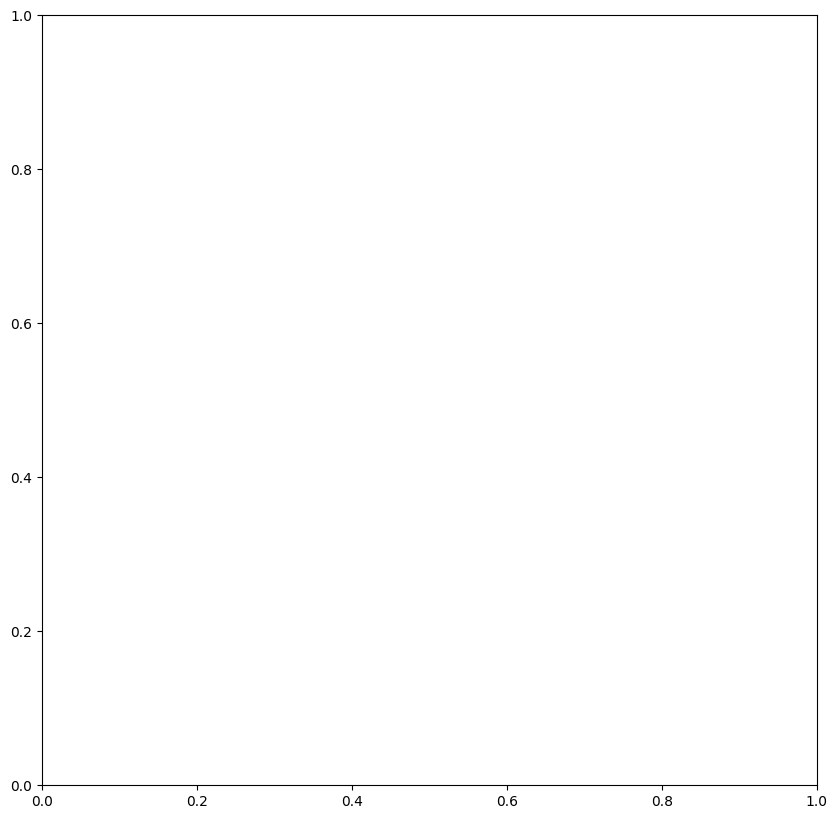

In [12]:
np.random.seed(202411)

grid_capacity: int = 1
grid_width: float = 10
grid_height: float = 10
grid_expand: tuple[int, int] = (10, 10)
width: float      # = grid_width * grid_expand[0]
height: float     # = grid_height * grid_expand[1]
node_number: int  # = grid_capacity * grid_expand[0] * grid_expand[1]
nodes: list[tuple[float, float]]
# width, height, node_number, nodes = SceneGenerator.grid(grid_capacity, grid_width, grid_height, True)
width, height, node_number, nodes = SceneGenerator.grid_expand(grid_capacity, grid_width, grid_height, grid_expand, True)

node_transmission_number = 9
node_transmission_range: float = SceneCalculator.transmission_range(width, height, node_number, node_transmission_number)
node_transmission_area: float = SceneCalculator.transmission_area(node_transmission_range)
node_occupied_area: float = SceneCalculator.occupied_area(width, height, node_number)

print(f"node occupied area: map_width * map_height / node_number = {width} * {height} / {node_number} = {node_occupied_area}")
print(f"node transmission range:")
print(f"  transmission number: {node_transmission_number}")
print(f"  transmission range: math.sqrt(occupied_area * transmission_number / math.pi) = math.sqrt({node_occupied_area} * {node_transmission_number} / {math.pi}) = {node_transmission_range}")
print(f"  transmission area: math.pi * transmission_range ^ 2 = {math.pi} * {node_transmission_range} ^ 2 = {node_transmission_area}")
sum_number: int = 0
for index, node in enumerate(nodes):
  sum_number += len([1 for other in nodes if Distance.euclidean(node, other) <= node_transmission_range])
print(f"average transmission number: sum_number / node_number = {sum_number} / {node_number} = {sum_number / node_number}")

startIndex, endIndex = np.random.choice(range(node_number), 2, False)
print(f"start: nodes[{startIndex}]: {nodes[startIndex]}\nend: nodes[{endIndex}]: {nodes[endIndex]}")

figureSize: tuple[float, float] = (10, 10)
simulator = Simulator(width, height, nodes, nodes[startIndex], nodes[endIndex], figureSize)


### Constructing Algorithms and Executing Routes

In [13]:
greedy = Greedy(node_transmission_range, Distance.euclidean_squared)
artists: list[artist.Artist] = simulator.execution(greedy, "Greedy Algorithm", True, True)

Greedy: route: current_node = (98.54, 77.68) ; len(path) =   1 ; len(priorityHistory) =   0 ; len(transmittable) =   2
Greedy: route: current_node = (92.90, 92.26) ; len(path) =   2 ; len(priorityHistory) =   1 ; len(transmittable) =   3
Greedy: route: current_node = (82.55, 86.44) ; len(path) =   3 ; len(priorityHistory) =   2 ; len(transmittable) =   7
Greedy: route: current_node = (97.75, 85.72) ; len(path) =   4 ; len(priorityHistory) =   3 ; len(transmittable) =   0
Greedy: route: current_node = (82.55, 86.44) ; len(path) =   3 ; len(priorityHistory) =   3 ; len(transmittable) =   7
Greedy: route: current_node = (72.81, 80.31) ; len(path) =   4 ; len(priorityHistory) =   3 ; len(transmittable) =   9
Greedy: route: current_node = (66.26, 65.01) ; len(path) =   5 ; len(priorityHistory) =   4 ; len(transmittable) =   8
Greedy: route: current_node = (63.83, 48.43) ; len(path) =   6 ; len(priorityHistory) =   5 ; len(transmittable) =   8
Greedy: route: current_node = (49.20, 55.59) ; l

In [14]:
random = Random(node_transmission_range)
artists: list[artist.Artist] = simulator.execution(random, "Randomized Algorithm", True, True)

Random: route: current_node = (98.54, 77.68) ; len(path) =   1 ; len(priorityHistory) =   0 ; len(transmittable) =   2
Random: route: current_node = (97.75, 85.72) ; len(path) =   2 ; len(priorityHistory) =   1 ; len(transmittable) =   2
Random: route: current_node = (82.55, 86.44) ; len(path) =   3 ; len(priorityHistory) =   2 ; len(transmittable) =   7
Random: route: current_node = (92.90, 92.26) ; len(path) =   4 ; len(priorityHistory) =   3 ; len(transmittable) =   1
Random: route: current_node = (81.22, 92.91) ; len(path) =   5 ; len(priorityHistory) =   4 ; len(transmittable) =   5
Random: route: current_node = (65.84, 95.10) ; len(path) =   6 ; len(priorityHistory) =   5 ; len(transmittable) =   5
Random: route: current_node = (68.20, 83.86) ; len(path) =   7 ; len(priorityHistory) =   6 ; len(transmittable) =   9
Random: route: current_node = (80.76, 78.01) ; len(path) =   8 ; len(priorityHistory) =   7 ; len(transmittable) =   4
Random: route: current_node = (85.33, 66.31) ; l

In [15]:
genetic = Genetic(node_transmission_range, 0.25, 0.25, 15, 100, Random(node_transmission_range), Score.euclidean_squaredSum)
artists: list[artist.Artist] = simulator.execution(genetic, "Genetic Algorithm", True, True)

Genetic: Generating initial population
Genetic: Generate path   1 | fitness: 3851.449203042813
Genetic: Generate path   2 | fitness: 4955.270760947289
Genetic: Generate path   3 | fitness: 4267.010406628992
Genetic: Generate path   4 | fitness: 3100.748960550383
Genetic: Generate path   5 | fitness: 7567.763948328392
Genetic: Generate path   6 | fitness: 3546.84839546297
Genetic: Generate path   7 | fitness: 6454.719911250608
Genetic: Generate path   8 | fitness: 2620.6019436786855
Genetic: Generate path   9 | fitness: 5069.346571479841
Genetic: Generate path  10 | fitness: 4731.006925657799
Genetic: Generate path  11 | fitness: 8412.673581440715
Genetic: Generate path  12 | fitness: 3392.0912582719393
Genetic: Generate path  13 | fitness: 7332.848380859071
Genetic: Generate path  14 | fitness: 4442.924494479132
Genetic: Generate path  15 | fitness: 1976.0932377690283
Genetic: Generation   0 : Best fitness: 1976.0932377690283
Genetic: Generation   1 : Best fitness: 1976.0932377690283
G